# Mapping Hospitals & Medial Centers in LA City
### by Mariana Estrada
### 
### Data sources: Hospitals & Medical Centers - County of LA Enterprise GIS (eGIS) Hub 

In [1]:
# Importing Geo pandas so I can use the library of functions to clean and plot my spatial data
import pandas as pd
import geopandas as gpd

In [2]:
# Importing Matplotlib and Contextily so I can use different tiles for my basemap and functions so I can plot my data
# Importing OpenStreetMaps to create a street network analysis
import matplotlib.pyplot as plt
import contextily as ctx
import osmnx as ox

# For spatial statistics
import esda
from esda.moran import Moran, Moran_Local

import splot
from splot.esda import moran_scatterplot, plot_moran, lisa_cluster,plot_moran_simulation

import libpysal as lps

# Graphics
import matplotlib.pyplot as plt
import plotly.express as px

In [3]:
# Importing my data set on hospitals and medical centers in LA County from the County of LA Enterprise GIS (eGIS) Hub
# Using pd since it is in tabular form
# Naming my data frame "data"
data=pd.read_csv("week_4_data/Hospitals_and_Medical_Centers.csv")

In [4]:
# to illustrate, bring in tracts
gdf_tracts=gpd.read_file("week_4_data/perc_bel_pov.geojson")

In [5]:
# Converting df to gdf
gdf=gpd.GeoDataFrame(data,
                     crs='epsg:4326',
                     geometry=gpd.points_from_xy(data.X, data.Y))

In [6]:
# Exploring data
# I want to know the type of data I have
type(data)

pandas.core.frame.DataFrame

In [7]:
# Exploring data
# I want to see the fields in my data set
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165 entries, 0 to 164
Data columns (total 32 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   X             165 non-null    float64 
 1   Y             165 non-null    float64 
 2   OBJECTID      165 non-null    int64   
 3   source        143 non-null    object  
 4   ext_id        13 non-null     object  
 5   cat1          165 non-null    object  
 6   cat2          165 non-null    object  
 7   cat3          110 non-null    object  
 8   org_name      82 non-null     object  
 9   Name          165 non-null    object  
 10  addrln1       163 non-null    object  
 11  addrln2       11 non-null     object  
 12  city          163 non-null    object  
 13  state         163 non-null    object  
 14  hours         158 non-null    object  
 15  phones        164 non-null    object  
 16  url           155 non-null    object  
 17  info1         10 non-null     object  
 18  info2     

In [8]:
# Exploring data
# I want to see some of my records
data.head()

,X,Y,OBJECTID,source,ext_id,cat1,cat2,cat3,org_name,Name,...,link,use_type,latitude,longitude,date_updated,email,dis_status,POINT_X,POINT_Y,geometry
0,-118.216024,34.204530,9,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Verdugo Hills Hospital,...,http://egis3.lacounty.gov/lms/?p=560,publish,34.204530,-118.216023,2016/01/29 10:45:00+00,NaN,NaN,6.496353e+06,1.896883e+06,POINT (-118.21602 34.20453)
1,-118.248312,34.075693,11,211,NaN,Health and Mental Health,Hospitals and Medical Centers,Respiratory Hospital,NaN,Barlow Respiratory Hospital - Los Angeles (Mai...,...,http://egis3.lacounty.gov/lms/?p=561,publish,34.075693,-118.248312,2016/01/21 15:56:47+00,NaN,NaN,6.486475e+06,1.850019e+06,POINT (-118.24831 34.07569)
2,-117.865075,34.127307,20,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Glendora Community Hospital,...,http://egis3.lacounty.gov/lms/?p=568,publish,34.127307,-117.865075,2016/01/22 14:39:39+00,NaN,NaN,6.602504e+06,1.868737e+06,POINT (-117.86507 34.12731)
3,-118.357113,33.838634,25,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,Providence Little Company of Mary Medical Center,Providence Little Company Of Mary Medical Cent...,...,http://egis3.lacounty.gov/lms/?p=569,publish,33.838634,-118.357113,2016/01/27 11:34:40+00,NaN,NaN,6.453221e+06,1.763848e+06,POINT (-118.35711 33.83863)
4,-118.257443,34.128058,35,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Glendale Memorial Hospital And Health Center,...,http://egis3.lacounty.gov/lms/?p=570,publish,34.128058,-118.257443,2016/01/22 16:10:02+00,NaN,NaN,6.483758e+06,1.869083e+06,POINT (-118.25744 34.12806)


In [9]:
# Exploring data
# I want to see more the last records in my data set
data.tail()

,X,Y,OBJECTID,source,ext_id,cat1,cat2,cat3,org_name,Name,...,link,use_type,latitude,longitude,date_updated,email,dis_status,POINT_X,POINT_Y,geometry
160,-118.396943,34.023195,71348,NaN,NaN,Health and Mental Health,Hospitals and Medical Centers,NaN,NaN,Southern California Hospital at Culver City,...,http://egis3.lacounty.gov/lms/?p=80733,publish,34.023195,-118.396943,2016/02/02 13:21:01+00,NaN,NaN,6.441390e+06,1.831059e+06,POINT (-118.39694 34.02320)
161,-118.396943,34.023195,71349,NaN,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Southern California Hospital at Culver City,...,http://egis3.lacounty.gov/lms/?p=80733,publish,34.023195,-118.396943,2016/02/02 13:21:01+00,NaN,NaN,6.441390e+06,1.831059e+06,POINT (-118.39694 34.02320)
162,-118.396943,34.023195,71350,NaN,NaN,Health and Mental Health,Hospitals and Medical Centers,Acute Care,NaN,Southern California Hospital at Culver City,...,http://egis3.lacounty.gov/lms/?p=80733,publish,34.023195,-118.396943,2016/02/02 13:21:01+00,NaN,NaN,6.441390e+06,1.831059e+06,POINT (-118.39694 34.02320)
163,-118.325144,34.096445,71351,NaN,NaN,Health and Mental Health,Hospitals and Medical Centers,NaN,NaN,Southern California Hospital at Hollywood,...,http://egis3.lacounty.gov/lms/?p=80738,publish,34.096445,-118.325144,2016/02/03 11:38:45+00,NaN,NaN,6.463232e+06,1.857638e+06,POINT (-118.32514 34.09645)
164,-118.325144,34.096445,71352,NaN,NaN,Health and Mental Health,Hospitals and Medical Centers,Acute Care,NaN,Southern California Hospital at Hollywood,...,http://egis3.lacounty.gov/lms/?p=80738,publish,34.096445,-118.325144,2016/02/03 11:38:45+00,NaN,NaN,6.463232e+06,1.857638e+06,POINT (-118.32514 34.09645)


In [10]:
# Exploring data
# I want to see a random sample of 10
data.sample(10)

,X,Y,OBJECTID,source,ext_id,cat1,cat2,cat3,org_name,Name,...,link,use_type,latitude,longitude,date_updated,email,dis_status,POINT_X,POINT_Y,geometry
125,-118.280346,34.072666,63383,211,NaN,Health and Mental Health,Hospitals and Medical Centers,NaN,NaN,Queenscare Family Clinics - Echo Park,...,http://egis3.lacounty.gov/lms/?p=70648,publish,34.072666,-118.280346,2010/11/01 11:50:56+00,NaN,NaN,6.476771e+06,1.848943e+06,POINT (-118.28035 34.07267)
46,-118.003427,33.950023,1207,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Whittier Hospital Medical Center,...,http://egis3.lacounty.gov/lms/?p=1238,publish,33.950023,-118.003427,2016/01/29 12:01:38+00,NaN,NaN,6.560631e+06,1.804193e+06,POINT (-118.00343 33.95002)
47,-118.158160,34.688078,1220,211,NaN,Health and Mental Health,Hospitals and Medical Centers,Trauma Center,NaN,Antelope Valley Hospital,...,http://egis3.lacounty.gov/lms/?p=1244,publish,34.688078,-118.158160,2016/01/21 14:53:23+00,NaN,NaN,6.514126e+06,2.072824e+06,POINT (-118.15816 34.68808)
39,-118.148692,33.859870,288,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Lakewood Regional Medical Center,...,http://egis3.lacounty.gov/lms/?p=698,publish,33.859870,-118.148692,2016/01/25 12:58:18+00,NaN,NaN,6.516526e+06,1.771417e+06,POINT (-118.14869 33.85987)
18,-118.265746,34.037364,66,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,Catholic Healthcare West,California Hospital Medical Center,...,http://egis3.lacounty.gov/lms/?p=574,publish,34.037364,-118.265746,2016/01/21 17:29:05+00,NaN,NaN,6.481158e+06,1.836084e+06,POINT (-118.26575 34.03736)
42,-118.185955,33.779852,1060,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,St. Mary Medical Center - Long Beach,...,http://egis3.lacounty.gov/lms/?p=1130,publish,33.779852,-118.185955,2016/01/28 15:59:43+00,NaN,NaN,6.505159e+06,1.742316e+06,POINT (-118.18595 33.77985)
120,-117.746916,34.097098,61785,NaN,NaN,Health and Mental Health,Hospitals and Medical Centers,NaN,Casa Colina,Casa Colina Centers for Rehabilitation,...,http://egis3.lacounty.gov/lms/?p=67934,publish,34.097098,-117.746916,2016/01/15 15:27:20+00,NaN,NaN,6.638291e+06,1.857813e+06,POINT (-117.74692 34.09710)
78,-118.064005,33.910791,1352,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Norwalk Community Hospital,...,http://egis3.lacounty.gov/lms/?p=1290,publish,33.910791,-118.064005,2016/01/26 17:19:27+00,NaN,NaN,6.542250e+06,1.789922e+06,POINT (-118.06400 33.91079)
58,-118.098594,33.912439,1258,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,Avanti Hospitals,Coast Plaza Doctors Hospital,...,http://egis3.lacounty.gov/lms/?p=1254,publish,33.912439,-118.098594,2016/01/22 11:18:44+00,NaN,NaN,6.531755e+06,1.790530e+06,POINT (-118.09859 33.91244)
95,-118.360252,34.057145,1428,211,NaN,Health and Mental Health,Hospitals and Medical Centers,911 Receiving,NaN,Olympia Medical Center,...,http://egis3.lacounty.gov/lms/?p=1315,publish,34.057145,-118.360252,2016/01/26 17:38:42+00,NaN,NaN,6.452552e+06,1.843372e+06,POINT (-118.36025 34.05714)


In [11]:
# Exploring data
# I want to know how may rows and columns there are
data.shape

(165, 32)

In [12]:
# Exploring data
# I want to know how many unique hospitals and medical centers there are in LA County
data['Name'].value_counts()

Cedars-Sinai Medical Center           9
California Hospital Medical Center    7
Antelope Valley Hospital              5
Centinela Hospital Medical Center     5
Beverly Hospital                      5
                                     ..
East Los Angeles Doctors Hospital     1
Coast Plaza Doctors Hospital          1
Catalina Island Medical Center        1
West Covina Medical Center            1
Glendale Adventist Medical Center     1
Name: Name, Length: 117, dtype: int64

In [13]:
# Preparing data
# Converting df to gdf
# My data set doesn't have a geometry so I will create a column where both x and y are included
gdf = gpd.GeoDataFrame(data,
                       crs='epsg:4326',
                       geometry=gpd.points_from_xy(data.X, data.Y))

In [14]:
# I want to see my new "Geomrety" field
print(gdf)

              X          Y  OBJECTID source ext_id                      cat1  \
0   -118.216024  34.204530         9    211    NaN  Health and Mental Health   
1   -118.248312  34.075693        11    211    NaN  Health and Mental Health   
2   -117.865075  34.127307        20    211    NaN  Health and Mental Health   
3   -118.357113  33.838634        25    211    NaN  Health and Mental Health   
4   -118.257443  34.128058        35    211    NaN  Health and Mental Health   
..          ...        ...       ...    ...    ...                       ...   
160 -118.396943  34.023195     71348    NaN    NaN  Health and Mental Health   
161 -118.396943  34.023195     71349    NaN    NaN  Health and Mental Health   
162 -118.396943  34.023195     71350    NaN    NaN  Health and Mental Health   
163 -118.325144  34.096445     71351    NaN    NaN  Health and Mental Health   
164 -118.325144  34.096445     71352    NaN    NaN  Health and Mental Health   

                              cat2     

In [15]:
# I want to review the cordinate system
gdf.crs

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

In [16]:
# Trimming the data
# I will review my data again
gdf.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
RangeIndex: 165 entries, 0 to 164
Data columns (total 32 columns):
 #   Column        Non-Null Count  Dtype   
---  ------        --------------  -----   
 0   X             165 non-null    float64 
 1   Y             165 non-null    float64 
 2   OBJECTID      165 non-null    int64   
 3   source        143 non-null    object  
 4   ext_id        13 non-null     object  
 5   cat1          165 non-null    object  
 6   cat2          165 non-null    object  
 7   cat3          110 non-null    object  
 8   org_name      82 non-null     object  
 9   Name          165 non-null    object  
 10  addrln1       163 non-null    object  
 11  addrln2       11 non-null     object  
 12  city          163 non-null    object  
 13  state         163 non-null    object  
 14  hours         158 non-null    object  
 15  phones        164 non-null    object  
 16  url           155 non-null    object  
 17  info1         10 non-null     object  
 18  in

In [17]:
# I will now trim my data
gdf[['source', 'cat3', 'Name', 'addrln1', 'city', 'hours', 'description', 'zip', 'geometry', 'X', 'Y']]

,source,cat3,Name,addrln1,city,hours,description,zip,geometry,X,Y
0,211,911 Receiving,Verdugo Hills Hospital,1812 Verdugo Blvd.,Glendale,Administrative hours are Monday through Friday...,The facility provides health education and hos...,91208.0,POINT (-118.21602 34.20453),-118.216024,34.204530
1,211,Respiratory Hospital,Barlow Respiratory Hospital - Los Angeles (Mai...,2000 Stadium Way,Los Angeles,Administrative hours are Monday through Friday...,For more than a century at Barlow Respiratory ...,90026.0,POINT (-118.24831 34.07569),-118.248312,34.075693
2,211,911 Receiving,Glendora Community Hospital,150 W. Route 66,Glendora,24 hours a day,Services provided include comprehensive acute ...,91740.0,POINT (-117.86507 34.12731),-117.865075,34.127307
3,211,911 Receiving,Providence Little Company Of Mary Medical Cent...,4101 Torrance Blvd.,Torrance,24 hours a day 7 days at week,Providence Little Company of Mary Medical Cent...,90503.0,POINT (-118.35711 33.83863),-118.357113,33.838634
4,211,911 Receiving,Glendale Memorial Hospital And Health Center,1420 S. Central Ave.,Glendale,"Monday through Friday, 9:00am to 5:00pm. Emer...","Established in 1926, Glendale Memorial Hospita...",91204.0,POINT (-118.25744 34.12806),-118.257443,34.128058
...,...,...,...,...,...,...,...,...,...,...,...
160,NaN,NaN,Southern California Hospital at Culver City,3828 Delmas Ter,Culver City,"24 hours a day, 7 days a week.","<p class=""paragraph_style_6"">From the day it o...",90232.0,POINT (-118.39694 34.02320),-118.396943,34.023195
161,NaN,911 Receiving,Southern California Hospital at Culver City,3828 Delmas Ter,Culver City,"24 hours a day, 7 days a week.","<p class=""paragraph_style_6"">From the day it o...",90232.0,POINT (-118.39694 34.02320),-118.396943,34.023195
162,NaN,Acute Care,Southern California Hospital at Culver City,3828 Delmas Ter,Culver City,"24 hours a day, 7 days a week.","<p class=""paragraph_style_6"">From the day it o...",90232.0,POINT (-118.39694 34.02320),-118.396943,34.023195
163,NaN,NaN,Southern California Hospital at Hollywood,6245 De Longpre Avenue,Hollywood,"5:30am to 7:30pm, Monday through Friday",Welcome to Southern California Hospital at Hol...,90028.0,POINT (-118.32514 34.09645),-118.325144,34.096445


In [18]:
# I will now declare the trim verion as a new variable
gdf_trimmed=gdf[['source', 'cat3', 'Name', 'addrln1', 'city', 'hours', 'description', 'zip', 'geometry', 'X', 'Y']]

In [19]:
gdf_trimmed.head()

,source,cat3,Name,addrln1,city,hours,description,zip,geometry,X,Y
0,211,911 Receiving,Verdugo Hills Hospital,1812 Verdugo Blvd.,Glendale,Administrative hours are Monday through Friday...,The facility provides health education and hos...,91208.0,POINT (-118.21602 34.20453),-118.216024,34.204530
1,211,Respiratory Hospital,Barlow Respiratory Hospital - Los Angeles (Mai...,2000 Stadium Way,Los Angeles,Administrative hours are Monday through Friday...,For more than a century at Barlow Respiratory ...,90026.0,POINT (-118.24831 34.07569),-118.248312,34.075693
2,211,911 Receiving,Glendora Community Hospital,150 W. Route 66,Glendora,24 hours a day,Services provided include comprehensive acute ...,91740.0,POINT (-117.86507 34.12731),-117.865075,34.127307
3,211,911 Receiving,Providence Little Company Of Mary Medical Cent...,4101 Torrance Blvd.,Torrance,24 hours a day 7 days at week,Providence Little Company of Mary Medical Cent...,90503.0,POINT (-118.35711 33.83863),-118.357113,33.838634
4,211,911 Receiving,Glendale Memorial Hospital And Health Center,1420 S. Central Ave.,Glendale,"Monday through Friday, 9:00am to 5:00pm. Emer...","Established in 1926, Glendale Memorial Hospita...",91204.0,POINT (-118.25744 34.12806),-118.257443,34.128058


In [20]:
# I want a random sample of my data set
gdf_trimmed.sample(10)

,source,cat3,Name,addrln1,city,hours,description,zip,geometry,X,Y
22,211,Disaster Resource Center,California Hospital Medical Center,1401 S. Grand Ave.,Los Angeles,24 hours a day.,The medical center provides comprehensive hosp...,90015.0,POINT (-118.26575 34.03736),-118.265746,34.037364
83,211,911 Receiving,Glendale Adventist Medical Center,1509 Wilson Terrace,Glendale,24 hours a day,Healing and servanthood are honorable attribut...,91206.0,POINT (-118.22979 34.15040),-118.229789,34.150401
129,211,NaN,Mission City Community Network Inc,15206 Parthenia St,North Hills,,The agency provides health services for people...,91343.0,POINT (-118.46381 34.22810),-118.463813,34.228101
47,211,Trauma Center,Antelope Valley Hospital,1600 West Avenue J,Lancaster,"Office hours are Monday through Friday, 8:00am...","The facility provides health education, hospit...",93534.0,POINT (-118.15816 34.68808),-118.158160,34.688078
13,211,Perinatal,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
57,211,911 Receiving,Catalina Island Medical Center,100 Falls Canyon Rd.,Avalon,24 hours a day,"As Avalon’s only hospital, we serve the medica...",90704.0,POINT (-118.33070 33.33919),-118.330699,33.339185
94,211,911 Receiving,Alhambra Hospital Medical Center,100 S. Raymond Ave.,Alhambra,Hospital is open 24 hours\r\nOther services av...,"Alhambra Hospital Medical Center, a 144-bed ge...",91801.0,POINT (-118.14397 34.09020),-118.143969,34.090201
154,NaN,NaN,Saint Vincent Medical Center,2131 West Third Street,Los Angeles,GENERAL ACUTE CARE\r\n8:30 a.m. – 8:30 p.m.,St. Vincent Medical Center is committed to imp...,90057.0,POINT (-118.27365 34.06382),-118.273655,34.063818
85,211,911 Receiving,White Memorial Medical Center,1720 E. Cesar E. Chavez Ave.,Los Angeles,24 hours a day,"The medical center provides health education, ...",90033.0,POINT (-118.21725 34.04926),-118.217245,34.049258
148,NaN,NaN,College Medical Center,2776 Pacific Avenue,Long Beach,"24 hours a day, 7 days a week.",For acute inpatient services we provide Medica...,90806.0,POINT (-118.19303 33.80731),-118.193031,33.807307


In [21]:
# Querying the data
# I want to see how many unique values there are "city"
gdf_trimmed['city'].value_counts()

Los Angeles         52
Long Beach           9
Lancaster            6
Montebello           5
Inglewood            5
Baldwin Park         4
Pasadena             4
West Covina          4
Glendale             3
Culver City          3
San Dimas            3
Whittier             3
Northridge           3
Pomona               3
Downey               2
San Gabriel          2
Monterey Park        2
Alhambra             2
Encino               2
Palmdale             2
Norwalk              2
Hollywood            2
Santa Monica         2
Glendora             2
Torrance             2
Panorama City        2
Van Nuys             2
Covina               2
Chino Hills          1
San Pedro            1
South El Monte       1
City of Commerce     1
Lincoln Heights      1
Sun Valley           1
North Hills          1
San Fernando         1
Monrovia             1
La Mirada            1
Harbor City          1
Avalon               1
Gardena              1
Tarzana              1
Paramount            1
Duarte     

In [22]:
# Querying the data
# I want to see the records that have hospitals in Los Angeles
gdf_trimmed.loc[gdf_trimmed['city']=='Los Angeles']

,source,cat3,Name,addrln1,city,hours,description,zip,geometry,X,Y
1,211,Respiratory Hospital,Barlow Respiratory Hospital - Los Angeles (Mai...,2000 Stadium Way,Los Angeles,Administrative hours are Monday through Friday...,For more than a century at Barlow Respiratory ...,90026.0,POINT (-118.24831 34.07569),-118.248312,34.075693
5,211,Trauma Center,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
6,211,911 Receiving,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
7,211,EDAP-PMC,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
8,211,Acute Care,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
9,211,Base Hospital,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
10,211,Disaster Resource Center,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
11,211,STEMI,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
12,211,Stroke,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
13,211,Perinatal,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219


In [23]:
# Querying the data
# I want to see the records that have hospitals in Inglewood
gdf_trimmed.loc[gdf_trimmed['city']=='Inglewood']

,source,cat3,Name,addrln1,city,hours,description,zip,geometry,X,Y
87,211,911 Receiving,Centinela Hospital Medical Center,555 E. Hardy St.,Inglewood,"Monday through Friday, 9:00am to 5:00pm; emerg...","As the only hospital located in Inglewood, Cal...",90301.0,POINT (-118.34826 33.95078),-118.348257,33.950783
88,211,EDAP-PMC,Centinela Hospital Medical Center,555 E. Hardy St.,Inglewood,"Monday through Friday, 9:00am to 5:00pm; emerg...","As the only hospital located in Inglewood, Cal...",90301.0,POINT (-118.34826 33.95078),-118.348257,33.950783
89,211,Respiratory Hospital,Centinela Hospital Medical Center,555 E. Hardy St.,Inglewood,"Monday through Friday, 9:00am to 5:00pm; emerg...","As the only hospital located in Inglewood, Cal...",90301.0,POINT (-118.34826 33.95078),-118.348257,33.950783
90,211,Perinatal,Centinela Hospital Medical Center,555 E. Hardy St.,Inglewood,"Monday through Friday, 9:00am to 5:00pm; emerg...","As the only hospital located in Inglewood, Cal...",90301.0,POINT (-118.34826 33.95078),-118.348257,33.950783
91,211,Rehabilitation,Centinela Hospital Medical Center,555 E. Hardy St.,Inglewood,"Monday through Friday, 9:00am to 5:00pm; emerg...","As the only hospital located in Inglewood, Cal...",90301.0,POINT (-118.34826 33.95078),-118.348257,33.950783


<AxesSubplot: >

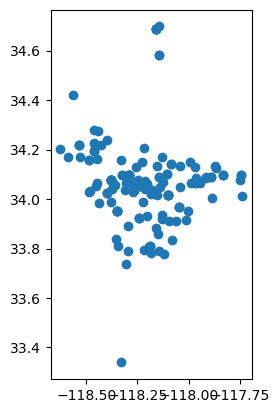

In [24]:
# Plotting to see my data set - even tho I have a geometry - I just want to see
gdf_trimmed.plot()

In [25]:
# Cleaning data
# Checking for null columns
gdf_trimmed.columns[gdf_trimmed.isna().all()].tolist()

[]

In [26]:
# I will look at the data again to see how I want to keep cleaning it
gdf_trimmed.head(1000)

,source,cat3,Name,addrln1,city,hours,description,zip,geometry,X,Y
0,211,911 Receiving,Verdugo Hills Hospital,1812 Verdugo Blvd.,Glendale,Administrative hours are Monday through Friday...,The facility provides health education and hos...,91208.0,POINT (-118.21602 34.20453),-118.216024,34.204530
1,211,Respiratory Hospital,Barlow Respiratory Hospital - Los Angeles (Mai...,2000 Stadium Way,Los Angeles,Administrative hours are Monday through Friday...,For more than a century at Barlow Respiratory ...,90026.0,POINT (-118.24831 34.07569),-118.248312,34.075693
2,211,911 Receiving,Glendora Community Hospital,150 W. Route 66,Glendora,24 hours a day,Services provided include comprehensive acute ...,91740.0,POINT (-117.86507 34.12731),-117.865075,34.127307
3,211,911 Receiving,Providence Little Company Of Mary Medical Cent...,4101 Torrance Blvd.,Torrance,24 hours a day 7 days at week,Providence Little Company of Mary Medical Cent...,90503.0,POINT (-118.35711 33.83863),-118.357113,33.838634
4,211,911 Receiving,Glendale Memorial Hospital And Health Center,1420 S. Central Ave.,Glendale,"Monday through Friday, 9:00am to 5:00pm. Emer...","Established in 1926, Glendale Memorial Hospita...",91204.0,POINT (-118.25744 34.12806),-118.257443,34.128058
...,...,...,...,...,...,...,...,...,...,...,...
160,NaN,NaN,Southern California Hospital at Culver City,3828 Delmas Ter,Culver City,"24 hours a day, 7 days a week.","<p class=""paragraph_style_6"">From the day it o...",90232.0,POINT (-118.39694 34.02320),-118.396943,34.023195
161,NaN,911 Receiving,Southern California Hospital at Culver City,3828 Delmas Ter,Culver City,"24 hours a day, 7 days a week.","<p class=""paragraph_style_6"">From the day it o...",90232.0,POINT (-118.39694 34.02320),-118.396943,34.023195
162,NaN,Acute Care,Southern California Hospital at Culver City,3828 Delmas Ter,Culver City,"24 hours a day, 7 days a week.","<p class=""paragraph_style_6"">From the day it o...",90232.0,POINT (-118.39694 34.02320),-118.396943,34.023195
163,NaN,NaN,Southern California Hospital at Hollywood,6245 De Longpre Avenue,Hollywood,"5:30am to 7:30pm, Monday through Friday",Welcome to Southern California Hospital at Hol...,90028.0,POINT (-118.32514 34.09645),-118.325144,34.096445


In [27]:
# I will now rename my columns
gdf_trimmed.columns=['Source',
                     'Type',
                     'Hospital_Name',
                     'Address',
                     'City',
                     'Hours',
                     'Description',
                     'Zip_Code',
                     'Geometry',
                     'Long',
                     'Lat']

In [28]:
# I will review my new columns
gdf_trimmed.sample(5)

,Source,Type,Hospital_Name,Address,City,Hours,Description,Zip_Code,Geometry,Long,Lat
29,211,Respiratory Hospital,Barlow Respiratory Hospital At Presbyterian In...,12401 Washington Blvd.,Whittier,24 hours a day,For more than a century at Barlow Respiratory ...,90602.0,POINT (-118.04936 33.96979),-118.049360,33.969794
4,211,911 Receiving,Glendale Memorial Hospital And Health Center,1420 S. Central Ave.,Glendale,"Monday through Friday, 9:00am to 5:00pm. Emer...","Established in 1926, Glendale Memorial Hospita...",91204.0,POINT (-118.25744 34.12806),-118.257443,34.128058
106,LA County Department of Health Services,NaN,Encino Hospital Medical Center,16237 Ventura Boulevard,Encino,NaN,<strong>Encino Hospital Medical Center (EHMC)<...,91436.0,POINT (-118.48673 34.15718),-118.486726,34.157184
128,211,NaN,Enki - Youth And Family Services - Margarita M...,1000 Goodrich Blvd,City of Commerce,"Monday, 9:00am to 6:00pm; Friday, 8:00am to 5:...",The agency provides mental health services for...,90022.0,POINT (-118.15466 34.01750),-118.154664,34.017503
138,211,NaN,City Of Baldwin Park Department Of Recreation ...,4100 Baldwin Park Blvd,Baldwin Park,Monday through Thursday 7:00 am to 2:00 pm; F...,Julia McNeill Senior Center at Morgan Park; Th...,91706.0,POINT (-117.96342 34.08685),-117.963418,34.086846


### I will not plot this data set since it has a geometry
### I will also not sort this data set since there isn't a value/number attached to a record

In [29]:
# I am only interested in mapping hospitals in LA City so I will make a new query where City = Los Angeles
gdf_trimmed[gdf_trimmed['City']=='Los Angeles']

,Source,Type,Hospital_Name,Address,City,Hours,Description,Zip_Code,Geometry,Long,Lat
1,211,Respiratory Hospital,Barlow Respiratory Hospital - Los Angeles (Mai...,2000 Stadium Way,Los Angeles,Administrative hours are Monday through Friday...,For more than a century at Barlow Respiratory ...,90026.0,POINT (-118.24831 34.07569),-118.248312,34.075693
5,211,Trauma Center,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
6,211,911 Receiving,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
7,211,EDAP-PMC,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
8,211,Acute Care,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
9,211,Base Hospital,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
10,211,Disaster Resource Center,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
11,211,STEMI,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
12,211,Stroke,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
13,211,Perinatal,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219


In [30]:
# My new data set only includes values in LA City
# I will now create a variable that holds this query
LA_City_Hospitals = gdf_trimmed[(gdf_trimmed['City'] == 'Los Angeles') | (gdf_trimmed['City'] == 'Northridge') | (gdf_trimmed['City'] == 'North Hills') | (gdf_trimmed['City'] == 'Sun Valley') | (gdf_trimmed['City'] == 'Lincoln Heights') | (gdf_trimmed['City'] == 'Sherman Oaks') | (gdf_trimmed['City'] == 'Woodland Hills') | (gdf_trimmed['City'] == 'Mission Hills') | (gdf_trimmed['City'] == 'Encino') | (gdf_trimmed['City'] == 'Tarzana') | (gdf_trimmed['City'] == 'Van Nuys') | (gdf_trimmed['City'] == 'Sun Valley') | (gdf_trimmed['City'] == 'Hollywood')] 

In [30]:
# I will now review my new data variable
LA_City_Hospitals.sample(10)

,Source,Type,Hospital_Name,Address,City,Hours,Description,Zip_Code,Geometry,Long,Lat
7,211,EDAP-PMC,Cedars-Sinai Medical Center,8700 Beverly Blvd.,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Cedars-Sinai is one of the largest nonprofit a...,90048.0,POINT (-118.38104 34.07622),-118.381038,34.076219
112,HSIP Freedom Gnis_structures,NaN,Promise Hospital of East Los Angeles,443 South Soto Street,Los Angeles,24 hours 7 days at week,Our hospital is like any other hospital except...,90033.0,POINT (-118.21281 34.03966),-118.212809,34.039659
1,211,Respiratory Hospital,Barlow Respiratory Hospital - Los Angeles (Mai...,2000 Stadium Way,Los Angeles,Administrative hours are Monday through Friday...,For more than a century at Barlow Respiratory ...,90026.0,POINT (-118.24831 34.07569),-118.248312,34.075693
22,211,Disaster Resource Center,California Hospital Medical Center,1401 S. Grand Ave.,Los Angeles,24 hours a day.,The medical center provides comprehensive hosp...,90015.0,POINT (-118.26575 34.03736),-118.265746,34.037364
24,211,911 Receiving,Children's Hospital Los Angeles,4650 Sunset Blvd,Los Angeles,"Monday through Friday, 8:00am to 5:00pm. Emer...",Children's Hospital Los Angeles (CHLA) is a 50...,90027.0,POINT (-118.29101 34.09802),-118.291013,34.098019
85,211,911 Receiving,White Memorial Medical Center,1720 E. Cesar E. Chavez Ave.,Los Angeles,24 hours a day,"The medical center provides health education, ...",90033.0,POINT (-118.21725 34.04926),-118.217245,34.049258
143,NaN,911 Receiving,Martin Luther King Jr. Community Hospital,"1680 E. 120th Street,",Los Angeles,24/7,The hospital has 131 beds providing general ac...,90059.0,POINT (-118.24278 33.92353),-118.242780,33.923530
116,LA County Department of Health Services,911 Receiving,Ronald Reagan UCLA Medical Center,757 Westwood Plaza,Los Angeles,24 hours,Ronald Reagan UCLA Medical Center is comprised...,90095.0,POINT (-118.44631 34.06644),-118.446314,34.066443
155,NaN,911 Receiving,Saint Vincent Medical Center,2131 West Third Street,Los Angeles,GENERAL ACUTE CARE\r\n8:30 a.m. – 8:30 p.m.,St. Vincent Medical Center is committed to imp...,90057.0,POINT (-118.27365 34.06382),-118.273655,34.063818
104,HSIP Freedom Airports_Heliports,911 Receiving,Northridge Hospital Medical Center,18300 Roscoe Blvd.,Northridge,24 hour emergency services,"<span style=""font-family: Calibri"">Nobody know...",91328.0,POINT (-118.53299 34.22035),-118.532994,34.220347


### I will now begin mapping!

In [31]:
# Importing folium since I forgot to do this earlier :p
import folium

In [32]:
# Starting a default map
m=folium.Map(),
m

(<folium.folium.Map at 0x7f9d155a7af0>,)

In [33]:
# Calculating the long and lat which is located in my original data set "data"
latitude=LA_City_Hospitals.Lat.mean()
longitude=LA_City_Hospitals.Long.mean()

In [34]:
# I want to see my longitude
longitude

-118.33304696263573

In [35]:
# I wany to see my latitude
latitude

34.08151401759005

In [36]:
# I will now bring the folium in with arguments
m=folium.Map(location=[latitude, longitude],
             tiles='CartoDB positron',
             attribution='CartoDB')
m

In [37]:
# I will now add markers to represent the hospitals in LA City
# There are are 52 records so I will use loops
for index, row in LA_City_Hospitals.iterrows():
    folium.Marker([row.Lat, row.Long],
                  icon=folium.Icon(color="green"),
                  popup = row.Hospital_Name,
                 ).add_to(m)
m

In [38]:
# Exporting maps
gdf.to_file('week_4_data/Hospitals_City_of_Los_Angeles.geojson',
            driver='GeoJSON')

In [39]:
# I will now add a title using code I found online
# Folium doesn't have a function for adding a title so it requires HTML 
for index, row in LA_City_Hospitals.iterrows():
    m = folium.Map(location=[latitude, longitude],
             tiles='CartoDB positron',
             attribution='CartoDB')
    title_html = '''<h3 align="center" style="font-size:20px"><b>Hospitals in LA City</b></h3>'''
    m.get_root().html.add_child(folium.Element(title_html))

m

In [40]:
# using read_file
# using same projection as data
# had the move the folder containing data in here for code to work

Cooling_Centers = gpd.read_file('cooling_data/Cooling_Heating_Centers_City_of_Los_Angeles.geojson')

In [41]:
Cooling_Centers.sample()

,X,Y,OBJECTID,GlobalID,FacilityName,IndoorOutdoor,Address,Bureau,CouncilDistrict,AltFacPhone,geometry
27,-118.283394,34.062317,124,c08803ad-1f10-4a27-9d5a-589f9b63140f,Lafayette Recreation Center,Indoor,"625 S La Fayette Park Pl, Los Angeles, CA 90057",Central,10,None,POINT (-118.28339 34.06232)


In [42]:
# I will now make hospital specific markers
# I will also add in my cooling layer

for index, row in LA_City_Hospitals.iterrows():
    m = folium.Map(location=[latitude, longitude],
             tiles='CartoDB positron',
             attribution='CartoDB')
    title_html = '''<h3 align="center" style="font-size:20px"><b>Hospitals & Medical Centers in LA City</b></h3>'''
    m.get_root().html.add_child(folium.Element(title_html))

m

for index, row in LA_City_Hospitals.iterrows():
    folium.Marker([row.Lat, row.Long],
                  icon=folium.Icon(color='red', icon='fa-thin fa-hospital', prefix='fa'),
                  popup = row.Hospital_Name
                 ).add_to(m)

m4=folium.FeatureGroup(name='Hospitals & Medical Centers').add_to(m)

for index, row in Cooling_Centers.iterrows():    
    folium.Marker([row.Y, row.X],
                  icon=folium.Icon(color='blue', icon='cloud', prefix='fa'),
                  popup = row.FacilityName
                 ).add_to(m)

m3=folium.FeatureGroup(name='Cooling Centers').add_to(m)

folium.LayerControl(position='topright', collapsed=True, autoZIndex=True).add_to(m)

m

In [43]:
folium.GeoJson('cooling_data/City_Boundary.geojson').add_to(m)

m

In [44]:
gdf_tracts.head(10)

,geoid,name,B17001001,"B17001001, Error",B17001002,"B17001002, Error",B17001003,"B17001003, Error",B17001004,"B17001004, Error",...,"B17001055, Error",B17001056,"B17001056, Error",B17001057,"B17001057, Error",B17001058,"B17001058, Error",B17001059,"B17001059, Error",geometry
0,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",3806.0,471.0,436.0,225.0,235.0,149.0,0.0,13.0,...,84.0,289.0,108.0,260.0,106.0,279.0,89.0,106.0,62.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009..."
1,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",4216.0,873.0,260.0,202.0,49.0,48.0,0.0,13.0,...,71.0,390.0,166.0,296.0,89.0,313.0,106.0,202.0,137.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033..."
2,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3583.0,486.0,650.0,302.0,331.0,168.0,40.0,46.0,...,78.0,400.0,191.0,263.0,87.0,117.0,45.0,92.0,54.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859..."
3,14000US06037101221,"Census Tract 1012.21, Los Angeles, CA",3686.0,719.0,735.0,342.0,369.0,227.0,0.0,13.0,...,106.0,190.0,100.0,145.0,83.0,59.0,48.0,118.0,173.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979..."
4,14000US06037101222,"Census Tract 1012.22, Los Angeles, CA",2690.0,520.0,1035.0,393.0,405.0,200.0,0.0,13.0,...,122.0,219.0,125.0,100.0,91.0,60.0,52.0,52.0,49.0,"MULTIPOLYGON (((-118.29434 34.25233, -118.2931..."
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",4026.0,420.0,290.0,208.0,129.0,97.0,0.0,13.0,...,87.0,207.0,77.0,226.0,109.0,336.0,143.0,206.0,50.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782..."
6,14000US06037101400,"Census Tract 1014, Los Angeles, CA",3356.0,624.0,241.0,135.0,115.0,76.0,0.0,13.0,...,67.0,238.0,98.0,268.0,94.0,227.0,91.0,82.0,54.0,"MULTIPOLYGON (((-118.32238 34.24963, -118.3221..."
7,14000US06037102103,"Census Tract 1021.03, Los Angeles, CA",1767.0,488.0,120.0,84.0,23.0,31.0,0.0,13.0,...,104.0,139.0,63.0,124.0,55.0,42.0,22.0,56.0,36.0,"MULTIPOLYGON (((-118.36533 34.22870, -118.3639..."
8,14000US06037102104,"Census Tract 1021.04, Los Angeles, CA",3770.0,466.0,269.0,138.0,126.0,83.0,0.0,13.0,...,82.0,434.0,148.0,254.0,70.0,268.0,120.0,128.0,82.0,"MULTIPOLYGON (((-118.35620 34.21971, -118.3559..."
9,14000US06037102105,"Census Tract 1021.05, Los Angeles, CA",1674.0,318.0,88.0,57.0,32.0,24.0,0.0,13.0,...,72.0,85.0,46.0,170.0,38.0,55.0,36.0,33.0,24.0,"MULTIPOLYGON (((-118.35307 34.20878, -118.3530..."


In [45]:
gdf_tracts['Percent_Pov']=round(gdf_tracts['B17001001']/gdf_tracts['B17001002'])
gdf_tracts.dtypes

geoid                 object
name                  object
B17001001            float64
B17001001, Error     float64
B17001002            float64
                      ...   
B17001058, Error     float64
B17001059            float64
B17001059, Error     float64
geometry            geometry
Percent_Pov          float64
Length: 122, dtype: object

In [46]:
gdf_tracts.sample(5)

,geoid,name,B17001001,"B17001001, Error",B17001002,"B17001002, Error",B17001003,"B17001003, Error",B17001004,"B17001004, Error",...,B17001056,"B17001056, Error",B17001057,"B17001057, Error",B17001058,"B17001058, Error",B17001059,"B17001059, Error",geometry,Percent_Pov
780,14000US06037228100,"Census Tract 2281, Los Angeles, CA",5785.0,1003.0,1566.0,626.0,811.0,385.0,25.0,44.0,...,158.0,84.0,181.0,96.0,122.0,96.0,106.0,103.0,"MULTIPOLYGON (((-118.25064 34.00906, -118.2495...",4.0
399,14000US06037183220,"Census Tract 1832.20, Los Angeles, CA",3251.0,372.0,401.0,224.0,253.0,130.0,0.0,13.0,...,181.0,89.0,109.0,60.0,102.0,58.0,97.0,53.0,"MULTIPOLYGON (((-118.19644 34.12039, -118.1964...",8.0
286,14000US06037132301,"Census Tract 1323.01, Los Angeles, CA",4074.0,644.0,924.0,442.0,455.0,243.0,29.0,45.0,...,295.0,188.0,329.0,129.0,20.0,26.0,84.0,47.0,"MULTIPOLYGON (((-118.53605 34.20106, -118.5347...",4.0
345,14000US06037139200,"Census Tract 1392, Los Angeles, CA",5712.0,740.0,545.0,287.0,189.0,132.0,45.0,59.0,...,286.0,140.0,610.0,194.0,423.0,212.0,242.0,132.0,"MULTIPOLYGON (((-118.53082 34.18024, -118.5295...",10.0
371,14000US06037141500,"Census Tract 1415, Los Angeles, CA",3006.0,682.0,81.0,78.0,40.0,50.0,0.0,13.0,...,266.0,92.0,293.0,219.0,189.0,75.0,212.0,70.0,"MULTIPOLYGON (((-118.48841 34.14266, -118.4882...",37.0


In [47]:
# Cleaning data
# Checking for null columns
gdf_tracts.columns[gdf_tracts.isna().all()].tolist()

[]

In [48]:
folium.GeoJson('week_4_data/perc_bel_pov.geojson').add_to(m)
m

In [54]:
for index, row in LA_City_Hospitals.iterrows():
    m = folium.Map(location=[latitude, longitude],
             tiles='CartoDB positron',
             attribution='CartoDB')
    title_html = '''<h3 align="center" style="font-size:20px"><b>Hospitals & Medical Centers in LA City</b></h3>'''
    m.get_root().html.add_child(folium.Element(title_html))
m

for index, row in LA_City_Hospitals.iterrows():
    folium.Marker([row.Lat, row.Long],
                  icon=folium.Icon(color='red', icon='fa-thin fa-hospital', prefix='fa'),
                  popup = row.Hospital_Name,
                  name = 'Hospitals & Medical Centers',
                 ).add_to(m)

m4=folium.FeatureGroup(name='Hospitals & Medical Centers').add_to(m)
for index, row in Cooling_Centers.iterrows():    
    folium.Marker([row.Y, row.X],
                  icon=folium.Icon(color='blue', icon='cloud', prefix='fa'),
                  popup = row.FacilityName,
                  name = 'Cooling Centers',
                 ).add_to(m)

m3=folium.FeatureGroup(name='Cooling Centers').add_to(m)
folium.Choropleth(
    geo_data=gdf_tracts,
    data=gdf_tracts,
    key_on='feature.properties.geoid',
    columns=['geoid', 'B17001002'],
    nan_fill_color='grey',
    nan_fill_opacity=0.4,
    fill_color='YlOrBr',
    line_weight=0,
    fill_opacity=0.8,
    legend_name='Percent Below the Poverty Line',
    name='Below the Poverty Line').add_to(m)

folium.LayerControl().add_to(m)

m

In [55]:
m.save('Perc_Bel_Pov_Ammenities.html')